In [ ]:
# default_exp 
from nbdev.showdoc import *
import numpy as np
import torch
from directed_graphs.datasets import DirectedStochasticBlockModel
from directed_graphs.diffusion_flow_embedding import DiffusionFlowEmbedder
device = 'cpu'
# device = torch.device('mps' if torch.has_mps else 'cpu')
%load_ext autoreload
%autoreload 2
print("Using device ", device)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Using device  cpu


# Testing the Diffusion Flow Embedder

The stochastic block models will be our best test cases here, as they provide enough points for diffusion to work, while still being interpretable.

# Testing with Pointcloud Manifold

In [ ]:
from directed_graphs.pointclouds import sbm, outward_flow, inward_flow, visualize_points_on_flow_field

In [ ]:
gt, X = sbm(500,5)
flows = outward_flow(X)

100
100
100
100
100


/var/folders/y5/4qfj8yjj1hb97n6q01_dg0km0000gn/T/ipykernel_13661/3401271907.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X = torch.tensor(X)


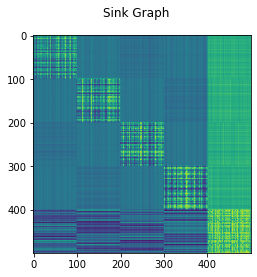

In [ ]:
import torch
import matplotlib.pyplot as plt
from directed_graphs.diffusion_flow_embedding import affinity_matrix_from_pointset_to_pointset
X = torch.tensor(X)
flows_at_coords = outward_flow(X)
inward_flows = inward_flow(X)
A_sbm_source = affinity_matrix_from_pointset_to_pointset(X, X, inward_flows,sigma=30, flow_strength=16)
plt.suptitle("Sink Graph")
plt.imshow(A_sbm_source)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


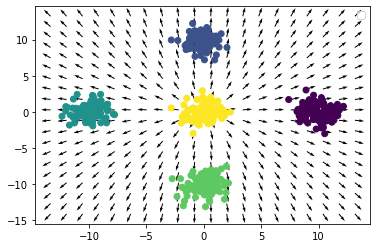

In [ ]:
visualize_points_on_flow_field(X, outward_flow, gt)

In [ ]:
gt, X = sbm(500,5)
flows = inward_flow(X) 
flows = torch.tensor(flows).float().to(device)
X = torch.tensor(X)
# flows_at_coords = outward_flow(X)
X = X.float().to(device)
flows_at_coords = flows_at_coords.float().to(device)

100
100
100
100
100


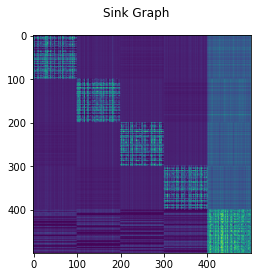

In [ ]:
A_sbm_source = affinity_matrix_from_pointset_to_pointset(X, X, flows,sigma=8, flow_strength=16)
plt.suptitle("Sink Graph")
plt.imshow(A_sbm_source)

In [ ]:
# import torch
# from torch import nn
# import torch.nn.functional as F
# import torch_geometric
# from tqdm import trange
# from directed_graphs.utils import diffusion_matrix_from_graph
# import numpy as np
# import matplotlib.pyplot as plt

# class DiffusionFlowEmbedder(torch.nn.Module):
# 	def __init__(self, X, flows, t = 4, sigma_graph = 0.5, sigma_embedding=0.5, embedding_dimension=2):
# 		"""Flow Embedding with diffusion

# 		Parameters
# 		----------
# 		X : torch tensor n_points x n_dim
# 			data matrix
# 		flows : torch tensor n_points x n_dim
# 			The flow at each point
# 		t : int
# 			Loss is computed with the diffusion operator powered to this number
# 		sigma in [0,1]
# 			Kernel bandwidth in the embedding
# 		"""
# 		# initialize parameters
# 		super(DiffusionFlowEmbedder, self).__init__()
# 		self.X = X
# 		self.ground_truth_flows = flows
# 		self.t = t
# 		self.sigma_embedding = sigma_embedding
# 		self.sigma_graph = sigma_graph
# 		self.nnodes = X.shape[0]
# 		self.data_dimension = X.shape[1]
# 		self.losses = []
# 		self.embedding_dimension = embedding_dimension
# 		# Compute P^t of the graph, the powered diffusion matrix
# 		# TODO: This can be optimized using landmarks, etc. For now it's straight sparse matrix multiplication
# 		# TODO: Migrate to a specialized function for dataset affinity calculation, with automatic kernel bandwidth selection, and the like
# 		self.P_graph = affinity_matrix_from_pointset_to_pointset(X,X,flows,sigma=sigma_graph)
# 		self.P_graph_t = torch.matrix_power(self.P_graph,self.t)
# 		# Flow field
# 		self.FlowArtist = nn.Sequential(nn.Linear(2, 10),
# 		                       nn.Tanh(),
# 		                       nn.Linear(10, 10),
# 		                       nn.Tanh(),
# 		                       nn.Linear(10, 2))
# 		# Autoencoder to embed the points into a low dimension
# 		self.encoder = nn.Sequential(nn.Linear(self.data_dimension, 100),
# 															nn.ReLU(),
# 															nn.Linear(100, 10),
# 															nn.ReLU(),
# 															nn.Linear(10, self.embedding_dimension))
# 		self.decoder = nn.Sequential(nn.Linear(self.embedding_dimension, 10),
# 															nn.ReLU(),
# 															nn.Linear(10, 100),
# 															nn.ReLU(),
# 															nn.Linear(100, self.data_dimension))
# 		# training ops
# 		self.KLD = nn.KLDivLoss(reduction='batchmean',log_target=False)
# 		self.MSE = nn.MSELoss()
# 		self.optim = torch.optim.Adam(self.parameters())
									

# 	def compute_embedding_P(self):
# 		A = affinity_matrix_from_pointset_to_pointset(self.embedded_points,self.embedded_points,flows = self.FlowArtist(self.embedded_points), sigma = self.sigma_embedding)
# 		# flow
# 		self.P_embedding = torch.diag(1/A.sum(axis=1)) @ A
# 		# power it
# 		self.P_embedding_t = torch.matrix_power(self.P_embedding,self.t)

# 	def loss(self):
# 		self.embedded_points = self.encoder(self.X)
# 		# compute embedding diffusion matrix
# 		self.compute_embedding_P()
# 		# compute autoencoder loss
# 		X_reconstructed = self.decoder(self.embedded_points)
# 		reconstruction_loss = self.MSE(X_reconstructed, self.X)
# 		# take KL divergence between it and actual P
# 		log_P_embedding_t = torch.log(self.P_embedding_t)
# 		diffusion_loss = self.KLD(log_P_embedding_t,self.P_graph_t)
# 		cost = diffusion_loss + reconstruction_loss
# 		# print(f"cost is KLD {diffusion_loss} with recon {reconstruction_loss}")
# 		self.losses.append([diffusion_loss,reconstruction_loss])
# 		return cost

# 	def visualize_points(self, labels):
# 		# controls the x and y axes of the plot
# 		# linspace(min on axis, max on axis, spacing on plot -- large number = more field arrows)
# 		minx = min(self.embedded_points[:,0].detach().cpu().numpy())-1
# 		maxx = max(self.embedded_points[:,0].detach().cpu().numpy())+1
# 		miny = min(self.embedded_points[:,1].detach().cpu().numpy())-1
# 		maxy = max(self.embedded_points[:,1].detach().cpu().numpy())+1
# 		x, y = np.meshgrid(np.linspace(minx,maxx,20),np.linspace(miny,maxy,20))
# 		x = torch.tensor(x,dtype=float).cpu()
# 		y = torch.tensor(y,dtype=float).cpu()
# 		xy_t = torch.concat([x[:,:,None],y[:,:,None]],dim=2).float().to('cuda')
# 		uv = self.FlowArtist(xy_t).detach()
# 		u = uv[:,:,0].cpu()
# 		v = uv[:,:,1].cpu()
		
# 		# quiver 
# 		# 	plots a 2D field of arrows
# 		# 	quiver([X, Y], U, V, [C], **kw); 
# 		# 	X, Y define the arrow locations, U, V define the arrow directions, and C optionally sets the color.
		
# 		sc = plt.scatter(self.embedded_points[:,0].detach().cpu(),self.embedded_points[:,1].detach().cpu(), c=labels)
# 		plt.quiver(x,y,u,v)
# 		plt.legend()
# 		# Display all open figures.
# 		plt.show()


# 	def fit(self,n_steps = 1000):
# 		# train Flow Embedder on the provided graph
# 		self.train()
# 		for step in trange(n_steps):
# 			self.optim.zero_grad()
# 			# compute loss
# 			loss = self.loss()
# 			# print("loss is ",loss)
# 			# compute gradient and step backwards
# 			loss.backward()
# 			self.optim.step()
# 			# TODO: Criteria to automatically end training
# 		print("Exiting training with loss ",loss)
# 		return self.embedded_points

/Users/adjourner/Projects/directed_graphs/directed_graphs/datasets.py:738: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X = torch.tensor(X)
/Users/adjourner/Projects/directed_graphs/directed_graphs/datasets.py:739: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  flow = torch.tensor(flow)


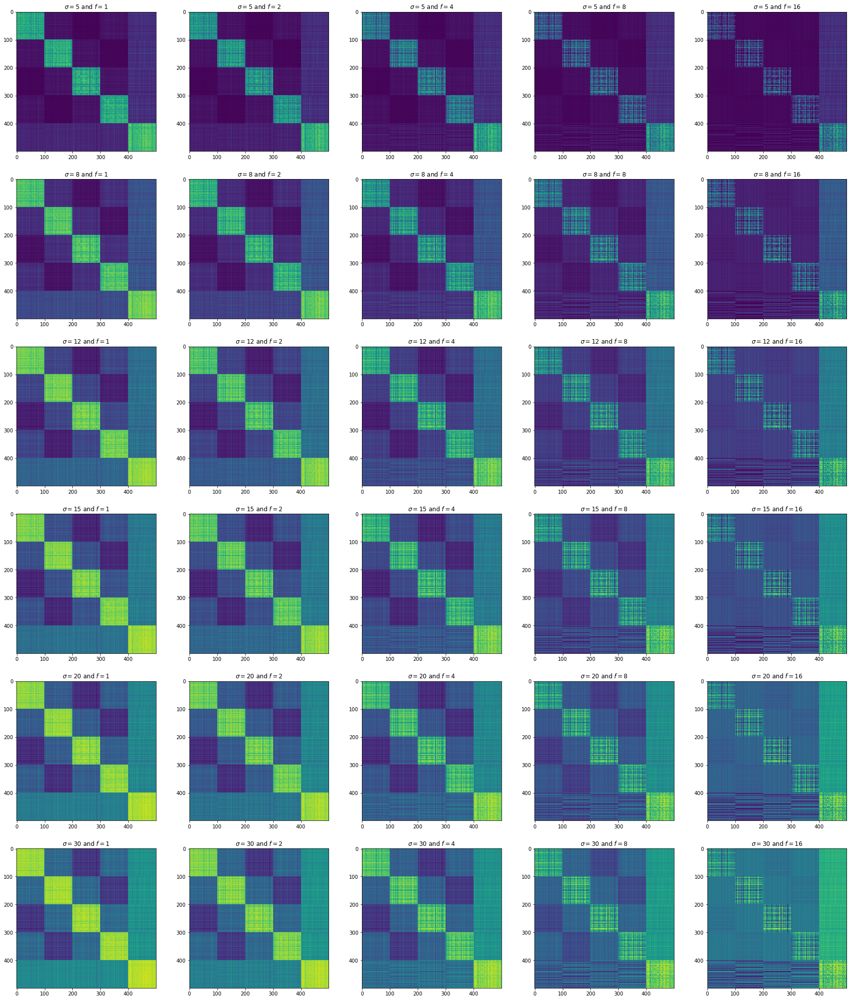

In [ ]:
from directed_graphs.datasets import affinity_grid_search
affinity_grid_search(X, flows, sigmas = [5,8,12,15,20,30],flow_strengths=[1,2,4,8,16])

  0%|          | 0/5000 [00:00<?, ?it/s]

EPOCH 0. Loss 0.041116513311862946. Flow strength 15.99899959564209. Weight of flow 1 Heatmap of P embedding is 


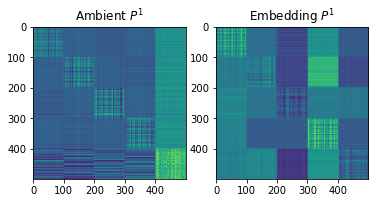

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


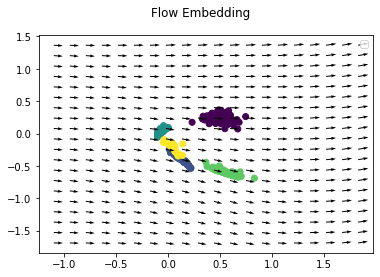

  2%|▏         | 99/5000 [00:09<07:38, 10.70it/s]

EPOCH 100. Loss 0.02401108667254448. Flow strength 15.973740577697754. Weight of flow 1 Heatmap of P embedding is 


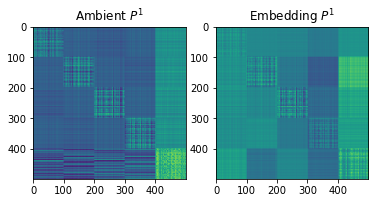

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


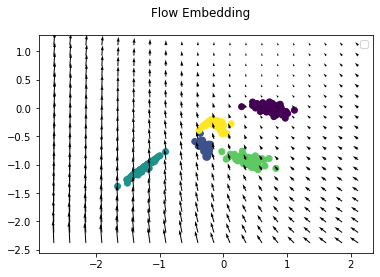

  4%|▍         | 199/5000 [00:18<07:19, 10.93it/s]

EPOCH 200. Loss 0.02074568159878254. Flow strength 15.976096153259277. Weight of flow 1 Heatmap of P embedding is 


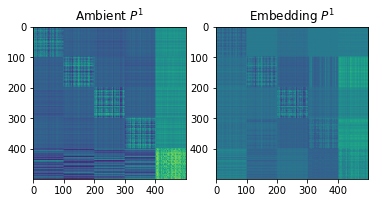

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


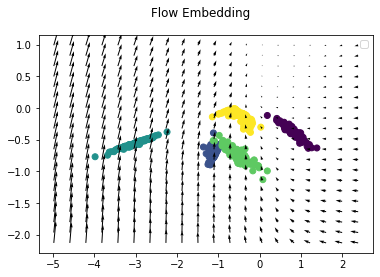

  6%|▌         | 299/5000 [00:27<07:07, 11.00it/s]

EPOCH 300. Loss 0.016291113570332527. Flow strength 16.012784957885742. Weight of flow 1 Heatmap of P embedding is 


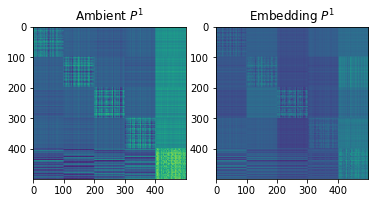

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


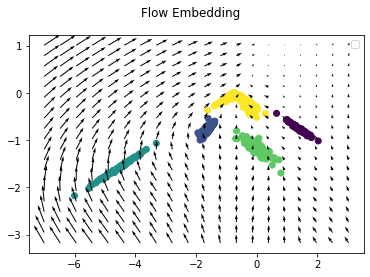

  8%|▊         | 399/5000 [00:37<07:04, 10.84it/s]

EPOCH 400. Loss 0.015070305205881596. Flow strength 16.019338607788086. Weight of flow 1 Heatmap of P embedding is 


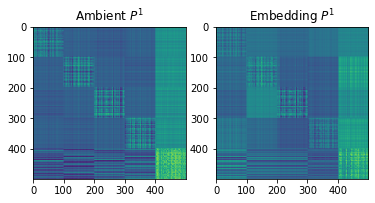

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


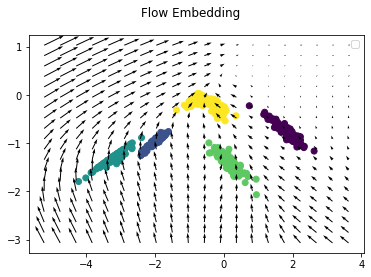

 10%|█         | 500/5000 [00:46<06:52, 10.91it/s]

EPOCH 500. Loss 0.01450909674167633. Flow strength 16.035825729370117. Weight of flow 1 Heatmap of P embedding is 


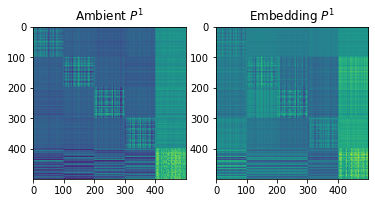

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


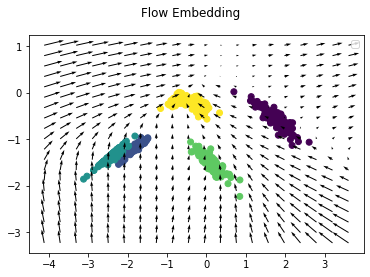

 12%|█▏        | 600/5000 [00:55<06:36, 11.09it/s]

EPOCH 600. Loss 0.01367142517119646. Flow strength 16.044944763183594. Weight of flow 1 Heatmap of P embedding is 


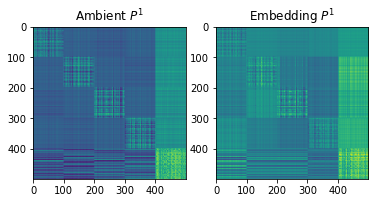

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


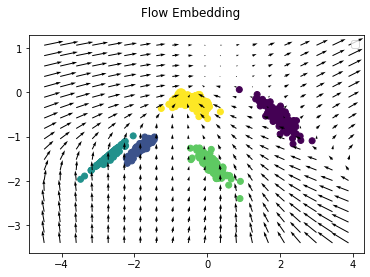

 14%|█▍        | 700/5000 [01:05<06:32, 10.96it/s]

EPOCH 700. Loss 0.012862791307270527. Flow strength 16.069198608398438. Weight of flow 1 Heatmap of P embedding is 


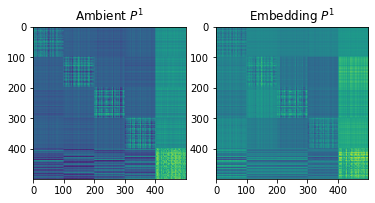

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


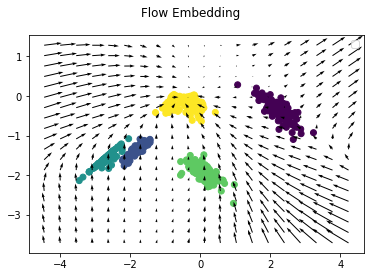

 16%|█▌        | 800/5000 [01:14<06:25, 10.91it/s]

EPOCH 800. Loss 0.012012838385999203. Flow strength 16.104412078857422. Weight of flow 1 Heatmap of P embedding is 


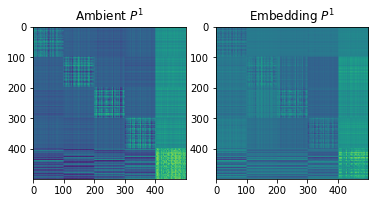

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


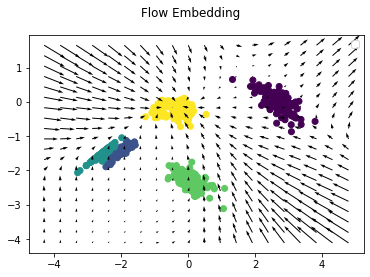

 18%|█▊        | 900/5000 [01:23<06:14, 10.94it/s]

EPOCH 900. Loss 0.011846145614981651. Flow strength 16.113588333129883. Weight of flow 1 Heatmap of P embedding is 


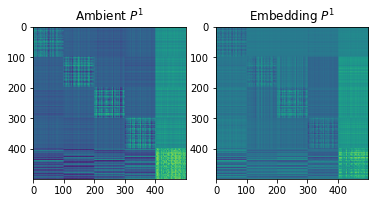

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


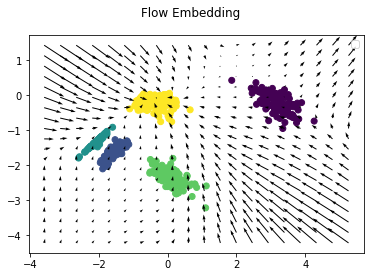

 20%|██        | 1000/5000 [01:33<06:10, 10.81it/s]

EPOCH 1000. Loss 0.011831137351691723. Flow strength 16.11679458618164. Weight of flow 1 Heatmap of P embedding is 


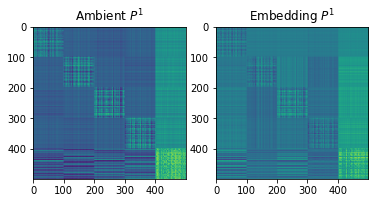

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


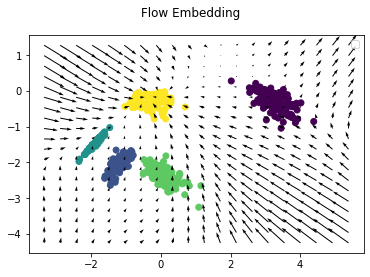

 22%|██▏       | 1100/5000 [01:42<06:01, 10.79it/s]

EPOCH 1100. Loss 0.011826137080788612. Flow strength 16.122289657592773. Weight of flow 1 Heatmap of P embedding is 


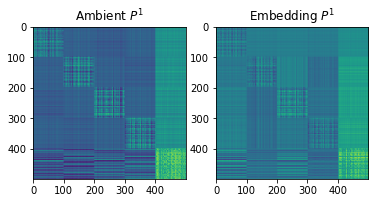

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


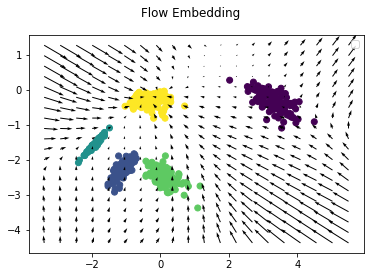

 24%|██▍       | 1200/5000 [01:51<05:49, 10.87it/s]

EPOCH 1200. Loss 0.011791457422077656. Flow strength 16.128082275390625. Weight of flow 1 Heatmap of P embedding is 


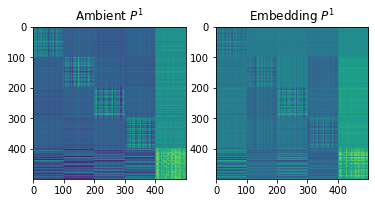

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


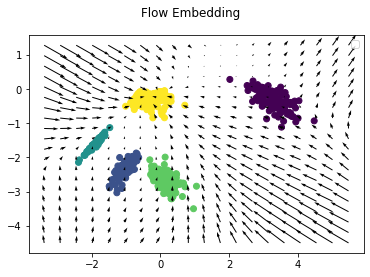

 26%|██▌       | 1299/5000 [02:01<05:38, 10.92it/s]

EPOCH 1300. Loss 0.011670219711959362. Flow strength 16.133209228515625. Weight of flow 1 Heatmap of P embedding is 


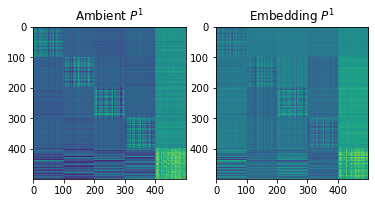

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


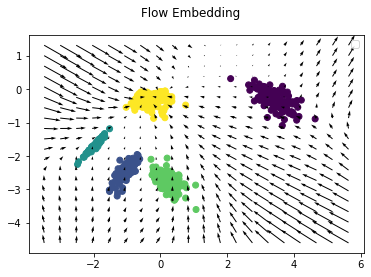

 28%|██▊       | 1399/5000 [02:10<05:25, 11.07it/s]

EPOCH 1400. Loss 0.011643944308161736. Flow strength 16.13825035095215. Weight of flow 1 Heatmap of P embedding is 


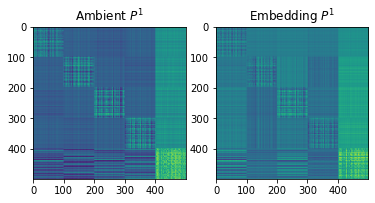

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


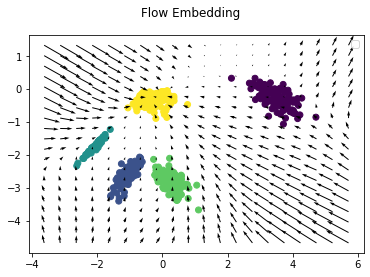

 30%|██▉       | 1499/5000 [02:19<05:18, 11.00it/s]

EPOCH 1500. Loss 0.011654399335384369. Flow strength 16.14411163330078. Weight of flow 1 Heatmap of P embedding is 


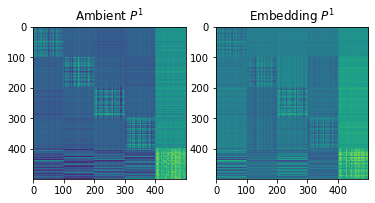

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


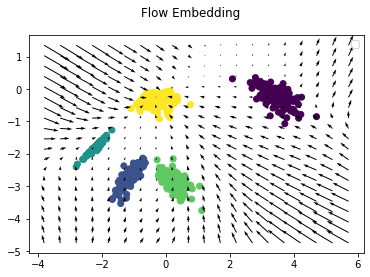

 32%|███▏      | 1599/5000 [02:29<05:08, 11.04it/s]

EPOCH 1600. Loss 0.011728002689778805. Flow strength 16.14988899230957. Weight of flow 1 Heatmap of P embedding is 


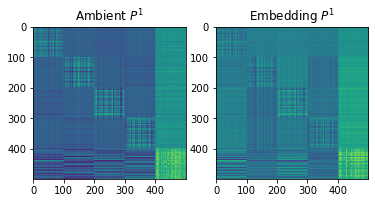

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


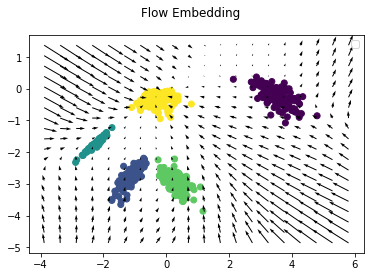

 34%|███▍      | 1700/5000 [02:38<04:51, 11.31it/s]

EPOCH 1700. Loss 0.011555107310414314. Flow strength 16.152482986450195. Weight of flow 1 Heatmap of P embedding is 


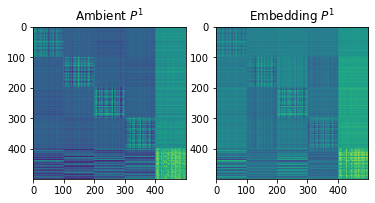

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


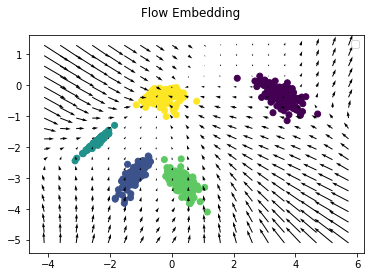

 36%|███▌      | 1800/5000 [02:47<04:52, 10.95it/s]

EPOCH 1800. Loss 0.011278524994850159. Flow strength 16.152570724487305. Weight of flow 1 Heatmap of P embedding is 


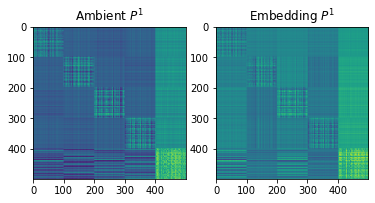

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


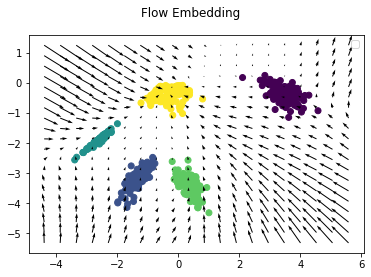

 38%|███▊      | 1900/5000 [02:57<04:44, 10.88it/s]

EPOCH 1900. Loss 0.010887044481933117. Flow strength 16.152587890625. Weight of flow 1 Heatmap of P embedding is 


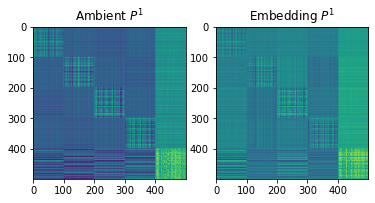

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


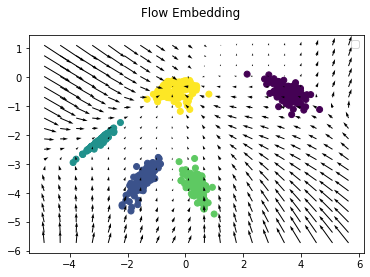

 40%|████      | 2000/5000 [03:06<04:30, 11.07it/s]

EPOCH 2000. Loss 0.011039955541491508. Flow strength 16.15529441833496. Weight of flow 1 Heatmap of P embedding is 


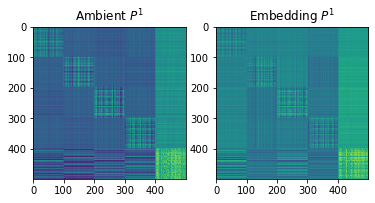

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


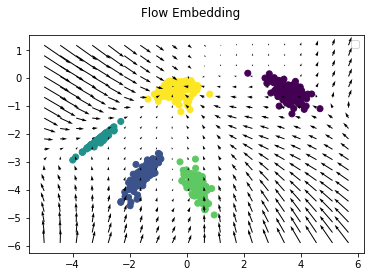

 42%|████▏     | 2100/5000 [03:15<04:20, 11.13it/s]

EPOCH 2100. Loss 0.010896878316998482. Flow strength 16.155799865722656. Weight of flow 1 Heatmap of P embedding is 


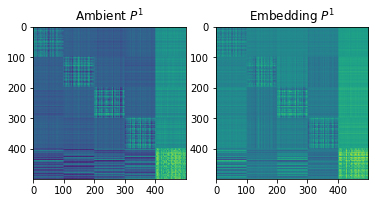

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


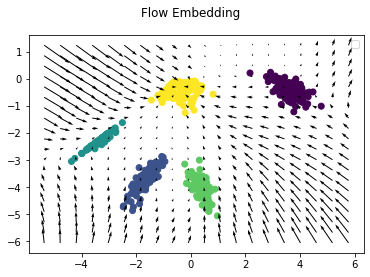

 44%|████▍     | 2200/5000 [03:24<04:13, 11.03it/s]

EPOCH 2200. Loss 0.010897431522607803. Flow strength 16.156095504760742. Weight of flow 1 Heatmap of P embedding is 


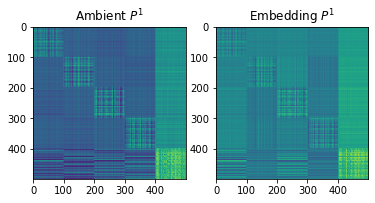

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


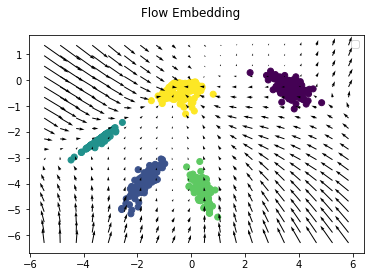

 46%|████▌     | 2299/5000 [03:34<04:02, 11.16it/s]

EPOCH 2300. Loss 0.011106080375611782. Flow strength 16.160789489746094. Weight of flow 1 Heatmap of P embedding is 


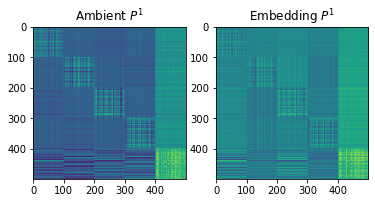

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


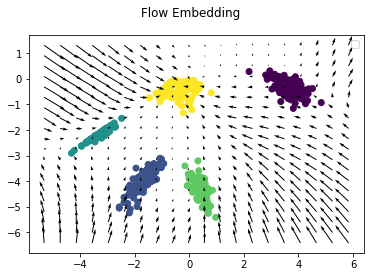

 48%|████▊     | 2399/5000 [03:43<03:54, 11.08it/s]

EPOCH 2400. Loss 0.011109031736850739. Flow strength 16.16483497619629. Weight of flow 1 Heatmap of P embedding is 


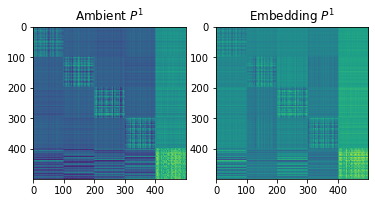

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


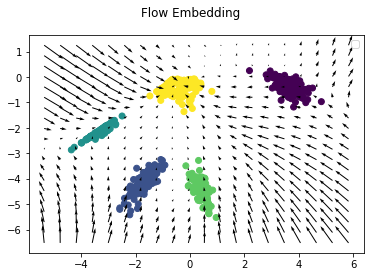

 50%|████▉     | 2499/5000 [03:52<03:40, 11.35it/s]

EPOCH 2500. Loss 0.011212076060473919. Flow strength 16.171672821044922. Weight of flow 1 Heatmap of P embedding is 


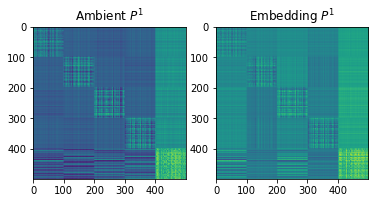

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


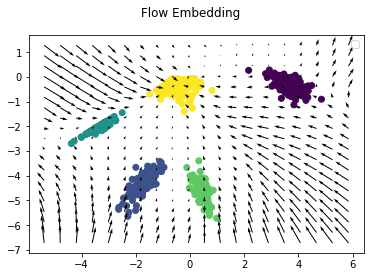

 52%|█████▏    | 2599/5000 [04:02<03:37, 11.02it/s]

EPOCH 2600. Loss 0.011072080582380295. Flow strength 16.178869247436523. Weight of flow 1 Heatmap of P embedding is 


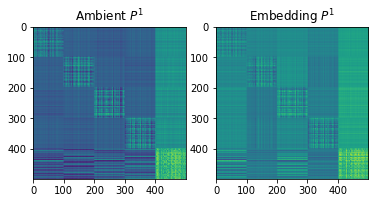

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


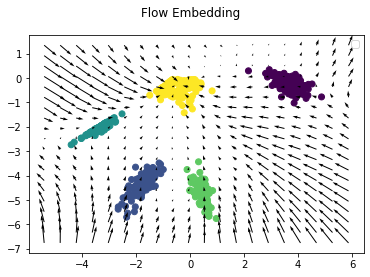

 54%|█████▍    | 2700/5000 [04:11<03:31, 10.87it/s]

EPOCH 2700. Loss 0.01072312705218792. Flow strength 16.18088722229004. Weight of flow 1 Heatmap of P embedding is 


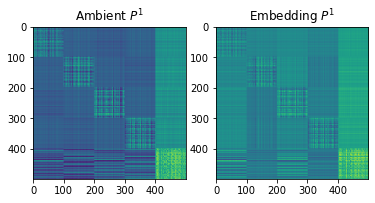

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


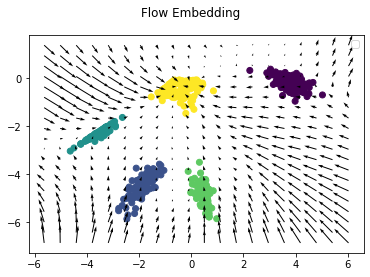

 56%|█████▌    | 2800/5000 [04:20<03:17, 11.12it/s]

EPOCH 2800. Loss 0.010626022703945637. Flow strength 16.183521270751953. Weight of flow 1 Heatmap of P embedding is 


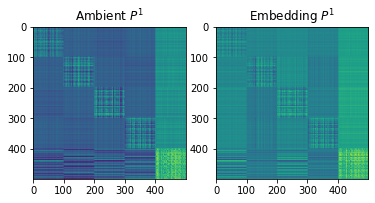

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


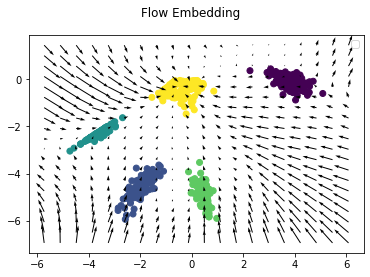

 58%|█████▊    | 2900/5000 [04:29<03:06, 11.28it/s]

EPOCH 2900. Loss 0.010385592468082905. Flow strength 16.182241439819336. Weight of flow 1 Heatmap of P embedding is 


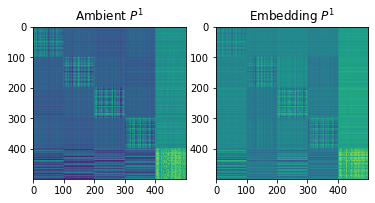

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


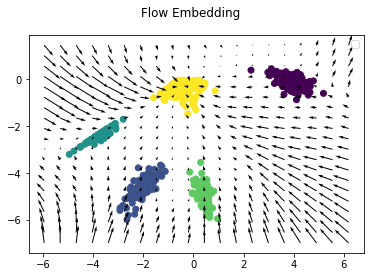

 60%|██████    | 3000/5000 [04:38<03:02, 10.99it/s]

EPOCH 3000. Loss 0.010248004458844662. Flow strength 16.183795928955078. Weight of flow 1 Heatmap of P embedding is 


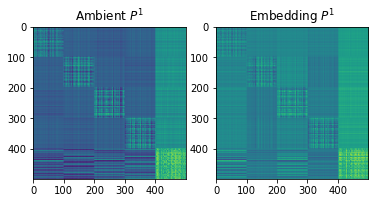

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


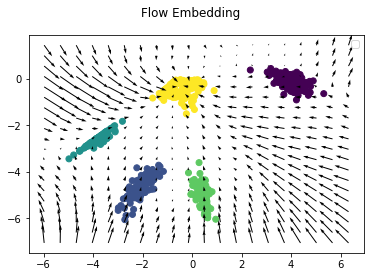

 62%|██████▏   | 3100/5000 [04:48<02:49, 11.20it/s]

EPOCH 3100. Loss 0.01009137462824583. Flow strength 16.184606552124023. Weight of flow 1 Heatmap of P embedding is 


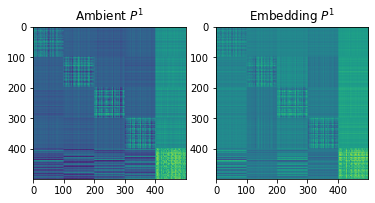

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


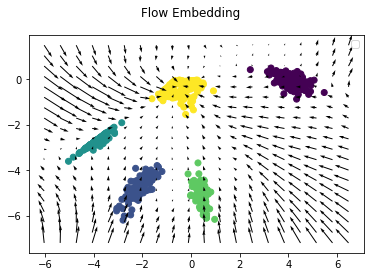

 64%|██████▍   | 3200/5000 [04:57<02:42, 11.11it/s]

EPOCH 3200. Loss 0.010361974127590656. Flow strength 16.18525505065918. Weight of flow 1 Heatmap of P embedding is 


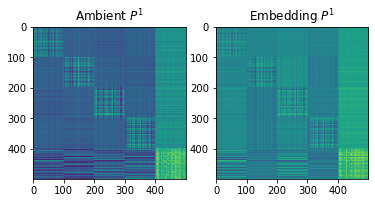

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


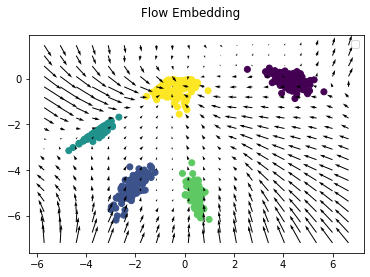

 66%|██████▌   | 3300/5000 [05:06<02:35, 10.95it/s]

EPOCH 3300. Loss 0.010305221192538738. Flow strength 16.192237854003906. Weight of flow 1 Heatmap of P embedding is 


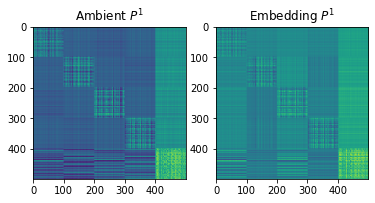

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


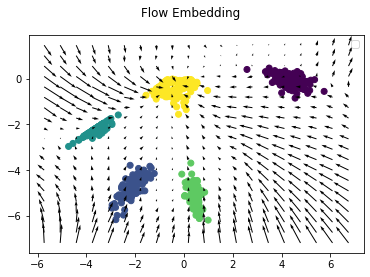

 68%|██████▊   | 3400/5000 [05:15<02:22, 11.24it/s]

EPOCH 3400. Loss 0.010084394365549088. Flow strength 16.198368072509766. Weight of flow 1 Heatmap of P embedding is 


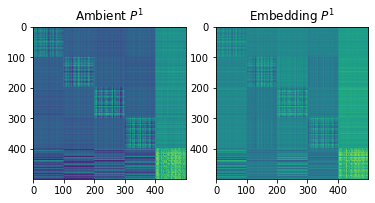

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


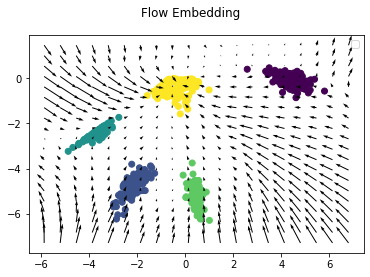

 70%|███████   | 3500/5000 [05:24<02:17, 10.93it/s]

EPOCH 3500. Loss 0.010049404576420784. Flow strength 16.19601058959961. Weight of flow 1 Heatmap of P embedding is 


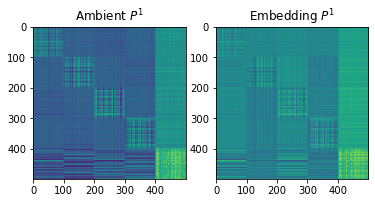

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


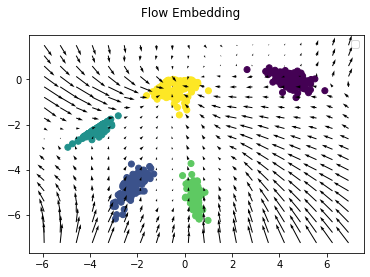

 72%|███████▏  | 3600/5000 [05:34<02:06, 11.09it/s]

EPOCH 3600. Loss 0.010076337493956089. Flow strength 16.199926376342773. Weight of flow 1 Heatmap of P embedding is 


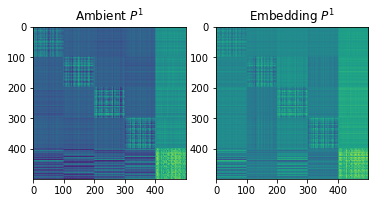

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


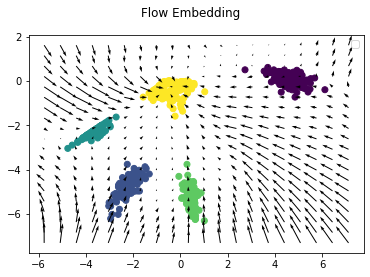

 74%|███████▍  | 3700/5000 [05:43<01:56, 11.13it/s]

EPOCH 3700. Loss 0.009873961098492146. Flow strength 16.197160720825195. Weight of flow 1 Heatmap of P embedding is 


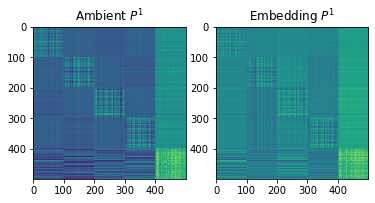

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


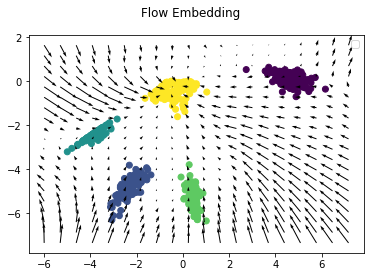

 76%|███████▌  | 3800/5000 [05:52<01:47, 11.11it/s]

EPOCH 3800. Loss 0.009935506619513035. Flow strength 16.206745147705078. Weight of flow 1 Heatmap of P embedding is 


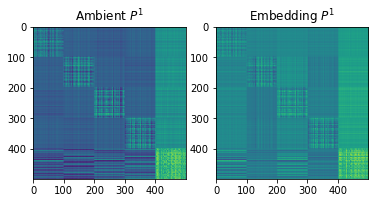

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


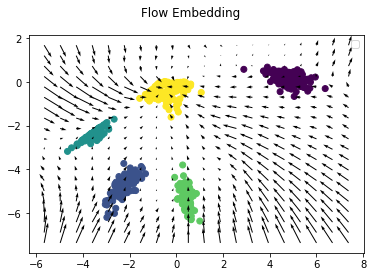

 78%|███████▊  | 3900/5000 [06:01<01:40, 10.99it/s]

EPOCH 3900. Loss 0.0099664106965065. Flow strength 16.219036102294922. Weight of flow 1 Heatmap of P embedding is 


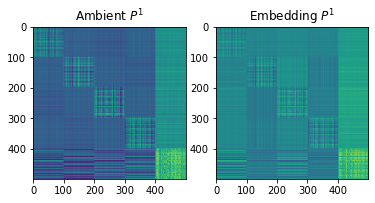

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


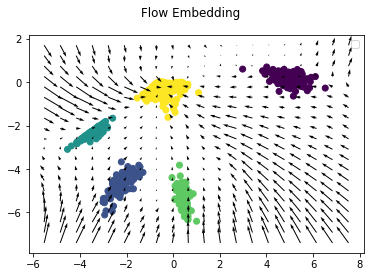

 80%|████████  | 4000/5000 [06:10<01:32, 10.84it/s]

EPOCH 4000. Loss 0.009762548841536045. Flow strength 16.224205017089844. Weight of flow 1 Heatmap of P embedding is 


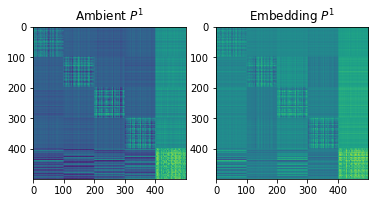

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


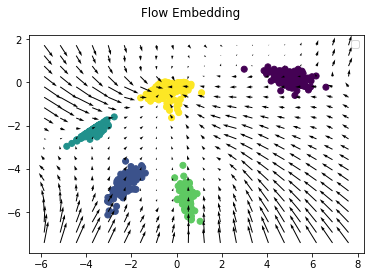

 82%|████████▏ | 4100/5000 [06:20<01:21, 11.11it/s]

EPOCH 4100. Loss 0.00953458622097969. Flow strength 16.214563369750977. Weight of flow 1 Heatmap of P embedding is 


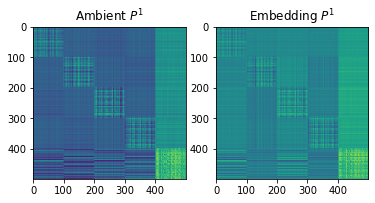

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


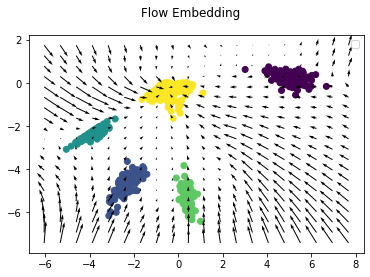

 84%|████████▍ | 4199/5000 [06:29<01:12, 11.01it/s]

EPOCH 4200. Loss 0.009574569761753082. Flow strength 16.21393585205078. Weight of flow 1 Heatmap of P embedding is 


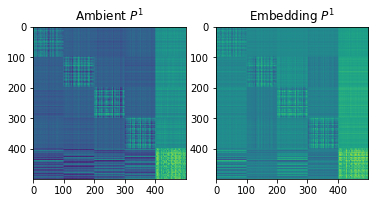

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


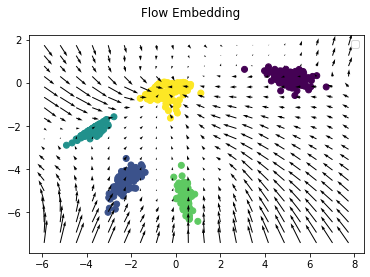

 86%|████████▌ | 4299/5000 [06:38<01:03, 11.06it/s]

EPOCH 4300. Loss 0.009440255351364613. Flow strength 16.20741081237793. Weight of flow 1 Heatmap of P embedding is 


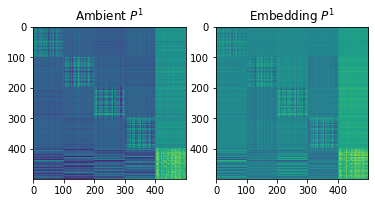

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


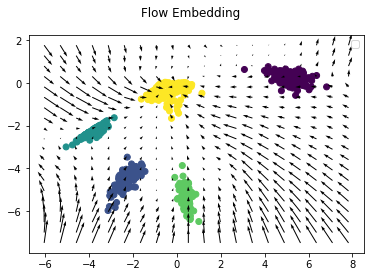

 88%|████████▊ | 4399/5000 [06:47<00:53, 11.16it/s]

EPOCH 4400. Loss 0.009392633102834225. Flow strength 16.203857421875. Weight of flow 1 Heatmap of P embedding is 


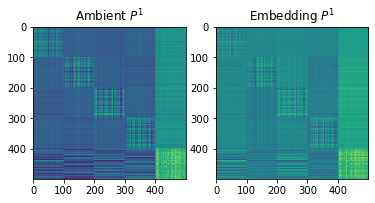

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


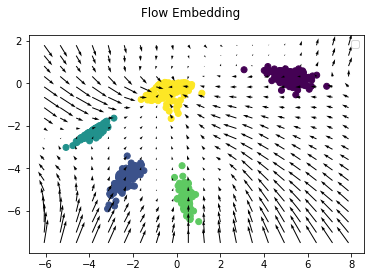

 90%|████████▉ | 4499/5000 [06:56<00:44, 11.14it/s]

EPOCH 4500. Loss 0.009228290989995003. Flow strength 16.19609832763672. Weight of flow 1 Heatmap of P embedding is 


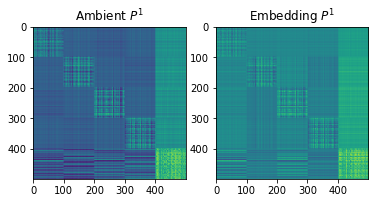

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


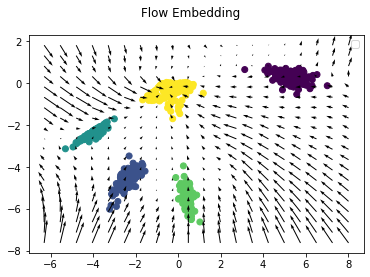

 92%|█████████▏| 4599/5000 [07:06<00:36, 10.95it/s]

EPOCH 4600. Loss 0.009070382453501225. Flow strength 16.186269760131836. Weight of flow 1 Heatmap of P embedding is 


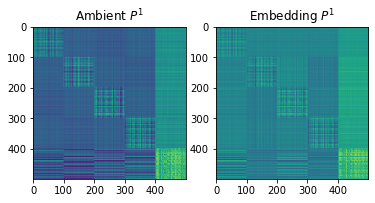

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


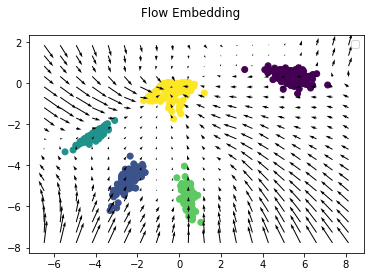

 94%|█████████▍| 4699/5000 [07:15<00:27, 10.94it/s]

EPOCH 4700. Loss 0.00896574929356575. Flow strength 16.17396354675293. Weight of flow 1 Heatmap of P embedding is 


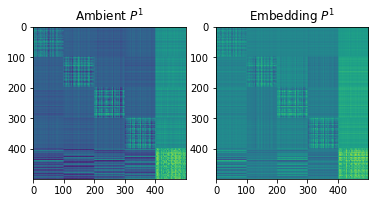

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


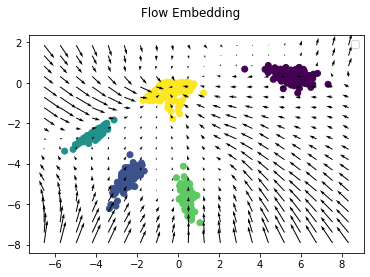

 96%|█████████▌| 4799/5000 [07:24<00:18, 11.12it/s]

EPOCH 4800. Loss 0.008908492513000965. Flow strength 16.160511016845703. Weight of flow 1 Heatmap of P embedding is 


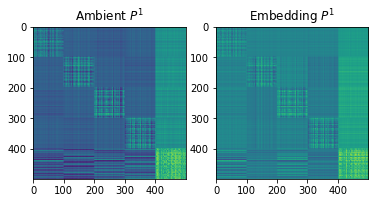

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


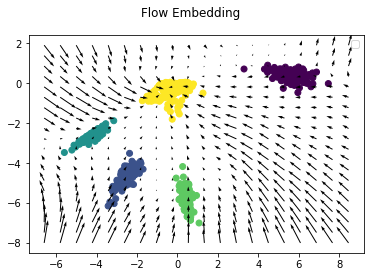

 98%|█████████▊| 4900/5000 [07:34<00:09, 11.08it/s]

EPOCH 4900. Loss 0.008899086154997349. Flow strength 16.154537200927734. Weight of flow 1 Heatmap of P embedding is 


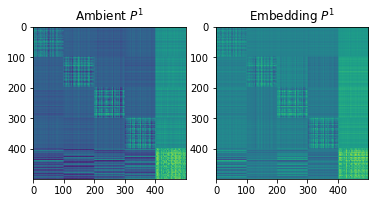

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


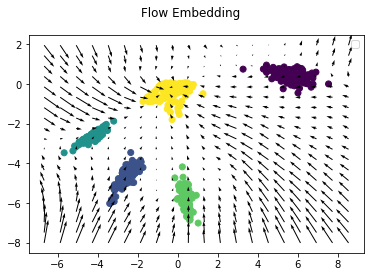

100%|██████████| 5000/5000 [07:43<00:00, 10.78it/s]

Exiting training with loss  tensor(0.0089, grad_fn=<AddBackward0>)


In [ ]:
from directed_graphs.diffusion_flow_embedding import DiffusionFlowEmbedder
dfe = DiffusionFlowEmbedder(X,flows,t=1,sigma_graph=30,
sigma_embedding=30, labels = gt, flow_strength_graph=16, flow_strength_embedding=16, learning_rate = 1e-3, smoothness=0,
flow_artist = "mlp", weight_of_flow=1)
dfe = dfe.to(device)
embeddings = dfe.fit(n_steps=5000)

In [ ]:
print(gt)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


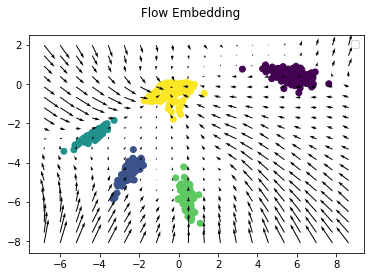

In [ ]:
dfe.visualize_points(gt)

In [ ]:
gt, X = sbm(500,5)
flows = outward_flow(X) 
flows = torch.tensor(flows).float().to(device)
X = torch.tensor(X)
X = X.float().to(device)

100
100
100
100
100


  0%|          | 0/5000 [00:00<?, ?it/s]

EPOCH 0. Loss 8.261285781860352. Flow strength 16.000999450683594. Weight of flow 0.8 Heatmap of P embedding is 


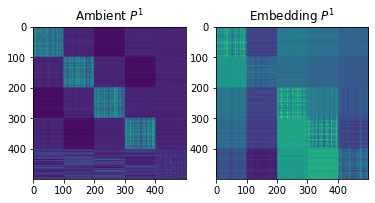

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


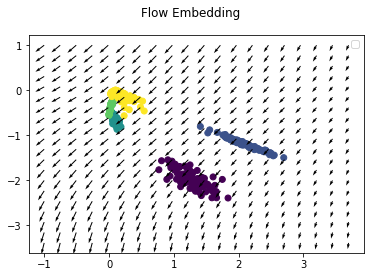

  2%|▏         | 100/5000 [00:09<07:35, 10.75it/s]

EPOCH 100. Loss 7.052542686462402. Flow strength 16.07172966003418. Weight of flow 0.8 Heatmap of P embedding is 


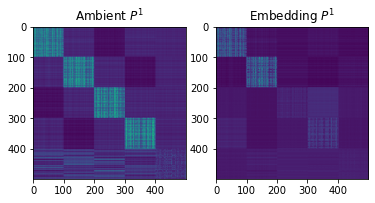

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


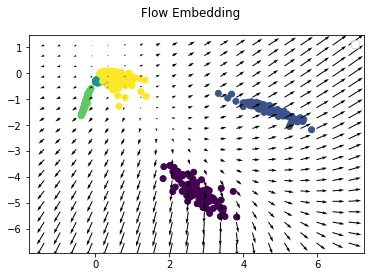

  4%|▍         | 200/5000 [00:19<07:20, 10.89it/s]

EPOCH 200. Loss 2.728199005126953. Flow strength 16.108396530151367. Weight of flow 0.8 Heatmap of P embedding is 


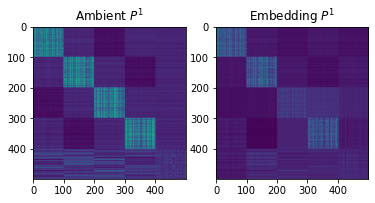

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


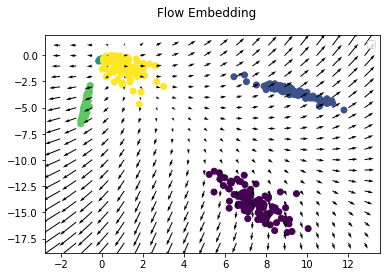

  6%|▌         | 300/5000 [00:28<07:20, 10.66it/s]

EPOCH 300. Loss 1.154662847518921. Flow strength 16.165191650390625. Weight of flow 0.8 Heatmap of P embedding is 


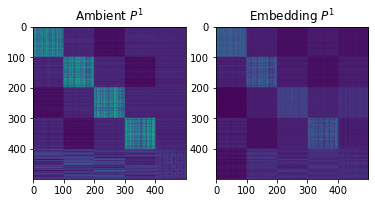

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


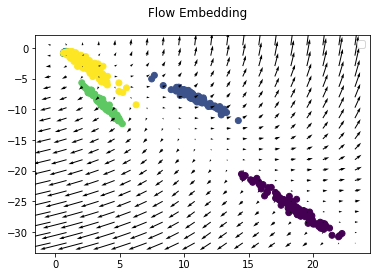

  8%|▊         | 400/5000 [00:37<07:04, 10.84it/s]

EPOCH 400. Loss 0.5642457008361816. Flow strength 16.181081771850586. Weight of flow 0.8 Heatmap of P embedding is 


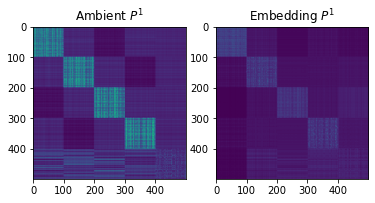

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


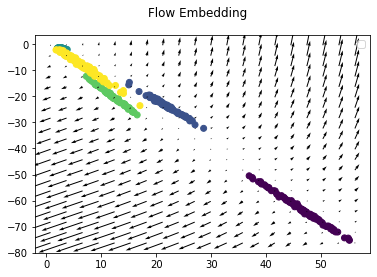

 10%|█         | 500/5000 [00:47<07:03, 10.64it/s]

EPOCH 500. Loss 0.34858107566833496. Flow strength 16.20093536376953. Weight of flow 0.8 Heatmap of P embedding is 


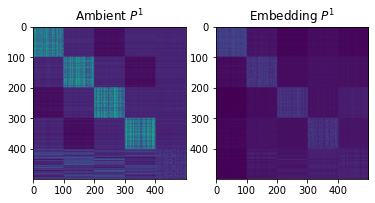

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


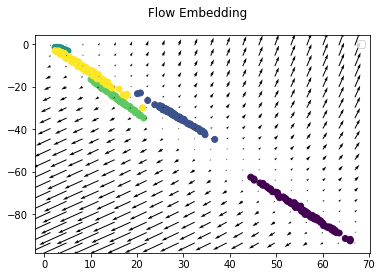

 12%|█▏        | 600/5000 [00:56<06:42, 10.93it/s]

EPOCH 600. Loss 0.27695757150650024. Flow strength 16.259265899658203. Weight of flow 0.8 Heatmap of P embedding is 


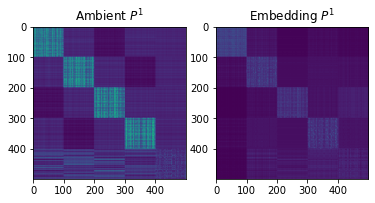

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


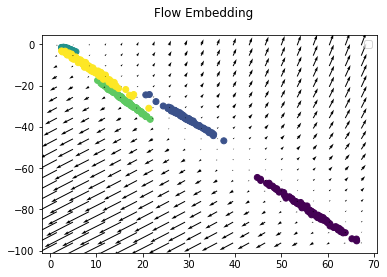

 14%|█▍        | 700/5000 [01:05<06:43, 10.65it/s]

EPOCH 700. Loss 0.22937139868736267. Flow strength 16.3023624420166. Weight of flow 0.8 Heatmap of P embedding is 


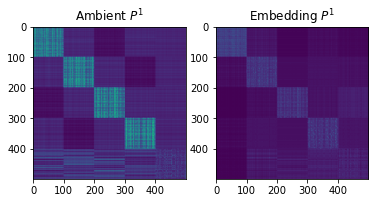

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


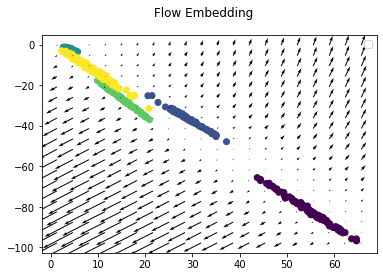

 16%|█▌        | 800/5000 [01:15<06:25, 10.88it/s]

EPOCH 800. Loss 0.190097838640213. Flow strength 16.35896110534668. Weight of flow 0.8 Heatmap of P embedding is 


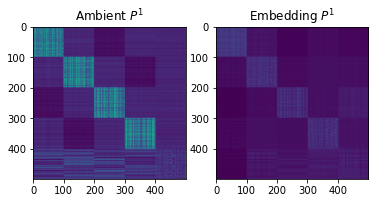

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


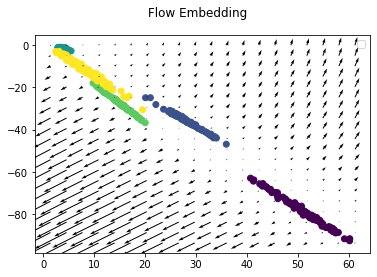

 18%|█▊        | 900/5000 [01:24<06:25, 10.64it/s]

EPOCH 900. Loss 0.19258642196655273. Flow strength 16.41507911682129. Weight of flow 0.8 Heatmap of P embedding is 


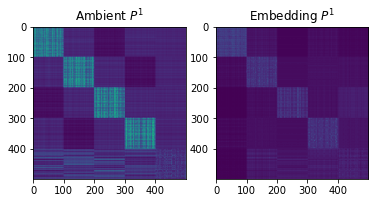

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


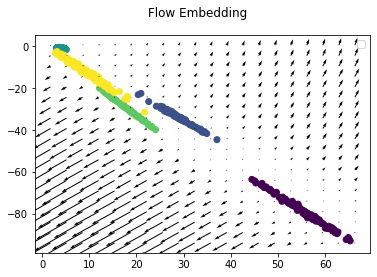

 20%|██        | 1000/5000 [01:34<06:01, 11.06it/s]

EPOCH 1000. Loss 0.19862669706344604. Flow strength 16.45375633239746. Weight of flow 0.8 Heatmap of P embedding is 


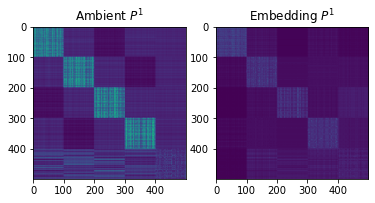

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


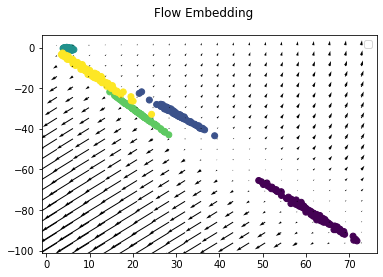

 22%|██▏       | 1100/5000 [01:43<05:56, 10.94it/s]

EPOCH 1100. Loss 0.25297558307647705. Flow strength 16.490535736083984. Weight of flow 0.8 Heatmap of P embedding is 


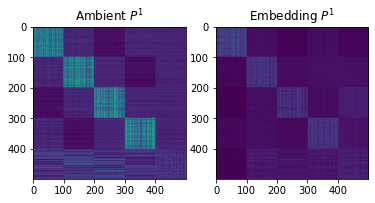

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


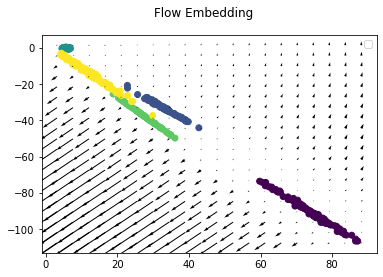

 24%|██▍       | 1200/5000 [01:52<05:53, 10.74it/s]

EPOCH 1200. Loss 0.2571525275707245. Flow strength 16.511404037475586. Weight of flow 0.8 Heatmap of P embedding is 


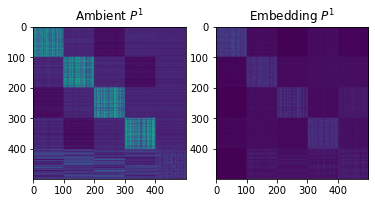

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


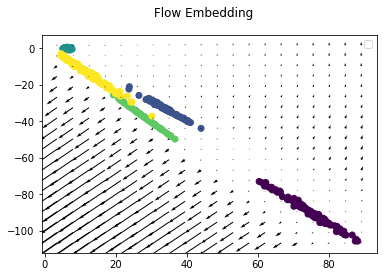

 26%|██▌       | 1300/5000 [02:02<05:41, 10.84it/s]

EPOCH 1300. Loss 0.27432724833488464. Flow strength 16.57772445678711. Weight of flow 0.8 Heatmap of P embedding is 


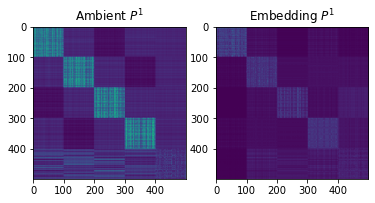

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


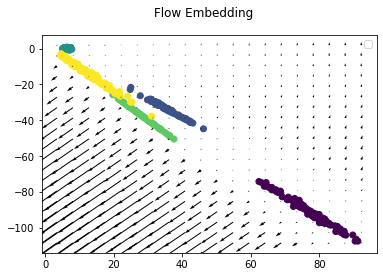

 28%|██▊       | 1400/5000 [02:11<05:38, 10.65it/s]

EPOCH 1400. Loss 0.2848483920097351. Flow strength 16.627958297729492. Weight of flow 0.8 Heatmap of P embedding is 


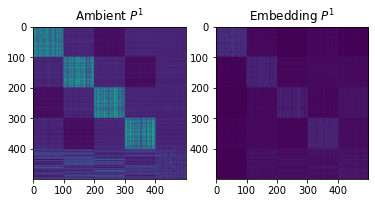

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


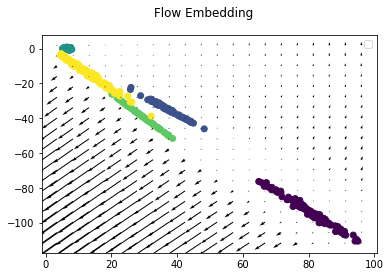

 28%|██▊       | 1411/5000 [02:12<05:38, 10.61it/s]


KeyboardInterrupt: 

In [ ]:
from directed_graphs.diffusion_flow_embedding import DiffusionFlowEmbedder
dfe = DiffusionFlowEmbedder(X,flows,t=1,sigma_graph=30,
sigma_embedding=30, labels = gt, flow_strength_graph=16, flow_strength_embedding=16, learning_rate = 1e-3, smoothness=0,
flow_artist = "mlp", weight_of_flow=1)
dfe = dfe.to(device)
embeddings = dfe.fit(n_steps=5000)

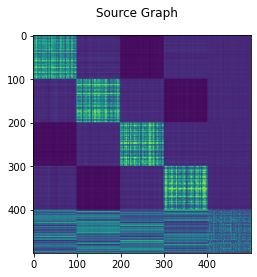

In [ ]:
A_sbm_source = affinity_matrix_from_pointset_to_pointset(X, X, flows,sigma=30, flow_strength=16)
plt.suptitle("Source Graph")
plt.imshow(A_sbm_source)